# Inspect data and search for failed simulations

In [1]:
import os
import re

# from freeenergyframework import plotting, stats, wrangle, absolute, plotlying
import numpy as np
# import matplotlib
from matplotlib import pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from  plotly import colors
from freeenergyframework import plotlying
import pandas as pd

from rdkit import Chem
from rdkit.Chem import Draw, PandasTools, rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D, IPythonConsole

rdDepictor.SetPreferCoordGen(True)
from IPython.display import SVG
import rdkit

from svgutils import transform as sg

from IPython.core.display import HTML
from scipy.stats import norm

from PLBenchmarks import targets, ligands, edges

from tqdm.notebook import tqdm
import pint
ureg = pint.UnitRegistry()

import benchmarkpl
path = benchmarkpl.__path__[0]
targets.setDataDir(path)

RDKit WARNING: [22:58:42] Enabling RDKit 2019.09.3 jupyter extensions


_ColormakerRegistry()

# Read in data for Parsley forcefield

Function to read in data

In [2]:
from benchmarkpl import load_data

In [3]:
df = load_data.getDetailedResults('jnk1')
df.head()

leg water                                \
                                repeat     1                       2         
                    Unnamed: 0_level_2   val   err  aerr  conv   val   err   
edge_17124_18634  edge_17124-1_18634-1 -7.66  0.10  0.11  0.05 -7.75  0.08   
edge_18626_18624  edge_18626-1_18624-1  0.16  0.09  0.09  0.12  0.17  0.08   
edge_18636_18625  edge_18636-1_18625-1 -0.71  0.07  0.08 -0.02 -0.84  0.07   
edge_18632_18624  edge_18632-1_18624-1  5.75  0.08  0.08 -0.01  5.83  0.06   
edge_18635_18625  edge_18635-1_18625-1  1.85  0.04  0.05  0.20  1.74  0.05   

                                    ...   ddg             ddg_mean        \
                                 3  ...     3                    -         
                  aerr  conv   val  ...   val   err  aerr      val   err   
edge_17124_18634  0.10  0.12 -7.71  ...  0.70  0.13  0.13     0.58  0.12   
edge_18626_18624  0.09  0.02  0.25  ...  0.44  0.14  0.13     0.56  0.10   
edge_18636_18625  0.08  0.07 -0.66  ... -0.44  0.16  0.20     0.25  0.39   
edge_18632_18624  0.07  0.16  5.75  ...  0.45  0.10  0.11     0.38  0.06   
edge_18635_18625  0.05  0.12  1.79  ...  0.54  0.10  0.09     0.57  0.06   

                           lig1     lig2 exp_DDG dexp_DDG  
                                                           
                  aerr                                     
edge_17124_18634  0.13  17124-1  18634-1   -0.33     0.29  
edge_18626_18624  0.09  18626-1  18624-1    0.38     0.21  
edge_18636_18625  0.39  18636-1  18625-1   -0.60     0.36  
edge_18632_18624  0.06  18632-1  18624-1    0.60     0.31  
edge_18635_18625  0.05  18635-1  18625-1   -0.83     0.18  

[5 rows x 41 columns]

# load all data into one dataframe

In [4]:
forcefield = 'openff-1.0.0.offxml'
dfs = []
for target in tqdm(targets.target_list):
    target = target["name"]
    df = load_data.getDetailedResults(target, forcefield=forcefield)
    if df is None:
        continue
    df.index = pd.Series([f'{target}_{edge}' for edge in df.index.values])
    df.loc[:, ('target', '', '')] = [f'{target}' for edge in df.index.values]
    dfs.append( df )
all_edges = pd.concat(dfs)
all_edges.head()

complex                                                  \
                            1                       2                       3   
                         aerr  conv   err   val  aerr  conv   err   val  aerr   
jnk1_edge_17124_18634    0.09  0.12  0.07 -7.31  0.09 -0.10  0.11 -7.06  0.09   
jnk1_edge_18626_18624    0.11 -0.15  0.14  0.72  0.11 -0.10  0.11  0.84  0.10   
jnk1_edge_18636_18625    0.15  0.13  0.12 -0.41  0.16  0.21  0.12  0.04  0.18   
jnk1_edge_18632_18624    0.09  0.12  0.07  6.10  0.07  0.03  0.07  6.17  0.08   
jnk1_edge_18635_18625    0.08 -0.03  0.09  2.48  0.07 -0.09  0.07  2.28  0.07   

                             ... water                                      \
                             ...     1           2                       3   
                       conv  ...   err   val  aerr  conv   err   val  aerr   
jnk1_edge_17124_18634  0.05  ...  0.10 -7.66  0.10  0.12  0.08 -7.75  0.09   
jnk1_edge_18626_18624 -0.23  ...  0.09  0.16  0.09  0.02  0.08  0.17  0.09   
jnk1_edge_18636_18625  0.27  ...  0.07 -0.71  0.08  0.07  0.07 -0.84  0.08   
jnk1_edge_18632_18624  0.04  ...  0.08  5.75  0.07  0.16  0.06  5.83  0.07   
jnk1_edge_18635_18625 -0.16  ...  0.04  1.85  0.05  0.12  0.05  1.74  0.05   

                                         
                                         
                       conv   err   val  
jnk1_edge_17124_18634 -0.03  0.09 -7.71  
jnk1_edge_18626_18624  0.04  0.09  0.25  
jnk1_edge_18636_18625  0.06  0.07 -0.66  
jnk1_edge_18632_18624  0.05  0.06  5.75  
jnk1_edge_18635_18625  0.21  0.04  1.79  

[5 rows x 42 columns]

# Filter out simulations with run issues (nan values as results)

In [5]:
isna = all_edges.isna()
isna.drop(labels=['exp_DDG', 'dexp_DDG', ('ddg_mean',  '-', 'aerr')], axis=1, inplace=True)
isna.drop(labels=['conv', 'aerr', 'err'], level=2, axis=1, inplace=True)
for i, row in isna.iterrows():
    if not np.any(row):
        isna.drop(labels=[i], axis=0, inplace=True)
isna

/home/dhahn3/miniconda3/envs/off/lib/python3.7/site-packages/pandas/core/generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


complex                  ddg         \
                                           1      2      3      1      2   
                                         val    val    val    val    val   
bace_edge_CAT-13o_CAT-17h              False  False  False   True  False   
tyk2_edge_ejm_31_jmc_28                False  False   True  False  False   
ros1_edge_1495_2606                    False   True   True  False   True   
ros1_edge_1495_6691                    False  False   True   True   True   
eg5_edge_CHEMBL1078774_CHEMBL1089056   False   True   True  False   True   
...                                      ...    ...    ...    ...    ...   
tnks2_edge_8f_5m                        True   True   True   True   True   
tnks2_edge_8f_8a                        True   True   True   True   True   
tnks2_edge_8a_5d                        True   True   True   True   True   
tnks2_edge_5o_5m                        True   True   True   True   True   
tnks2_edge_5d_5m                        True   True   True   True   True   

                                            ddg_mean                leg  \
                                          3        -             repeat   
                                        val      val Unnamed: 0_level_2   
bace_edge_CAT-13o_CAT-17h             False     True              False   
tyk2_edge_ejm_31_jmc_28                True     True              False   
ros1_edge_1495_2606                    True     True              False   
ros1_edge_1495_6691                    True     True              False   
eg5_edge_CHEMBL1078774_CHEMBL1089056   True    False              False   
...                                     ...      ...                ...   
tnks2_edge_8f_5m                       True     True              False   
tnks2_edge_8f_8a                       True     True              False   
tnks2_edge_8a_5d                       True     True              False   
tnks2_edge_5o_5m                       True     True              False   
tnks2_edge_5d_5m                       True     True              False   

                                       lig1   lig2 target  water                
                                                               1      2      3  
                                                             val    val    val  
bace_edge_CAT-13o_CAT-17h             False  False  False   True  False  False  
tyk2_edge_ejm_31_jmc_28               False  False  False  False  False  False  
ros1_edge_1495_2606                   False  False  False  False  False  False  
ros1_edge_1495_6691                   False  False  False   True   True   True  
eg5_edge_CHEMBL1078774_CHEMBL1089056  False  False  False  False   True   True  
...                                     ...    ...    ...    ...    ...    ...  
tnks2_edge_8f_5m                      False  False  False  False   True   True  
tnks2_edge_8f_8a                      False  False  False  False   True   True  
tnks2_edge_8a_5d                      False  False  False  False   True   True  
tnks2_edge_5o_5m                      False  False  False  False   True   True  
tnks2_edge_5d_5m                      False  False  False  False   True   True  

[530 rows x 14 columns]

In [6]:
nan = [i for i, row in isna.iterrows() if row[('ddg_mean', '-', 'val')] ]
print(nan)

['bace_edge_CAT-13o_CAT-17h', 'tyk2_edge_ejm_31_jmc_28', 'ros1_edge_1495_2606', 'ros1_edge_1495_6691', 'eg5_edge_CHEMBL1082249_CHEMBL1082248', 'eg5_edge_CHEMBL1082248_CHEMBL1083836', 'eg5_edge_CHEMBL1084677_CHEMBL1083836', 'eg5_edge_CHEMBL1077204_CHEMBL1083836', 'eg5_edge_CHEMBL1083836_CHEMBL1096002', 'cdk8_edge_18_13', 'hif2a_edge_266_156', 'pfkfb3_edge_49_42', 'pfkfb3_edge_49_44', 'pfkfb3_edge_44_68', 'pde10_edge_7395_3484', 'pde10_edge_3806_5973', 'pde10_edge_3806-mvEster_5973', 'syk_edge_CHEMBL3265015_CHEMBL3265011', 'syk_edge_CHEMBL3265015_CHEMBL3265017', 'syk_edge_CHEMBL3265015_CHEMBL3265009', 'syk_edge_CHEMBL3265015_CHEMBL3264999', 'syk_edge_CHEMBL3265015_CHEMBL3265014', 'syk_edge_CHEMBL3265015_CHEMBL3259820', 'syk_edge_CHEMBL3265031_CHEMBL3265024', 'syk_edge_CHEMBL3265031_CHEMBL3265037', 'syk_edge_CHEMBL3265031_CHEMBL3265030_n', 'syk_edge_CHEMBL3265021_CHEMBL3265011', 'syk_edge_CHEMBL3265021_CHEMBL3265024', 'syk_edge_CHEMBL3265021_CHEMBL3265022', 'syk_edge_CHEMBL3265021_CHEMBL3

In [24]:
from plotly import colors
from rdkit.Chem import rdFMCS, TemplateAlign
newcolors = []
c = [colors.hex_to_rgb(c) for c in colors.cyclical.mrybm]
#c = [colors.unlabel_rgb(c) for c in colors.sequential.Bluyl]
# print(c)
for i, e in enumerate(c[8:14]):
    newcolors.append(e)
    newcolors.append(colors.find_intermediate_color(e, c[i+9], 0.5))
newcolors = [ colors.unconvert_from_RGB_255(c) for c in newcolors ]
newcolorsH = []
# c = [colors.unlabel_rgb(c) for c in colors.sequential.Peach]
# print(c)
for i, e in enumerate(c[:6]):
    newcolorsH.append(e)
    newcolorsH.append(colors.find_intermediate_color(e, c[i+1], 0.5))
newcolorsH = [ colors.unconvert_from_RGB_255(c) for c in newcolorsH ]

def drawPerturbation(m1, m2, pairs, target='', n1='', n2='', text=''):
    d2d = rdMolDraw2D.MolDraw2DSVG(600,300,300,300)
    drawoptions = d2d.drawOptions()
    drawoptions.padding = 0.15
    drawoptions.prepareMolsBeforeDrawing = True
#     drawoptions.addAtomIndices = True
#     drawoptions.atomsLabels = True
#     d2d.SetDrawOptions(drawoptions)
#     drawoptions.centreMoleculesBeforeDrawing = False
    # Generate 2D Depictions
    mcs = rdFMCS.FindMCS([m1,m2], 
                         atomCompare=rdFMCS.AtomCompare.CompareAny, 
                         bondCompare=rdFMCS.BondCompare.CompareAny,
                         timeout=10) # find maximum common substructure (MCS)
    pattern = Chem.MolFromSmarts(mcs.smartsString) # generate mol with MCS
    match = m1.GetSubstructMatch(pattern) # get substruct match of MCS with first mol
    conf = m1.GetConformer(0) # get first molecule's conformer
        

    cnf = Chem.Conformer(len(match)) # generate a conformer for pattern
    [ cnf.SetAtomPosition(i, conf.GetAtomPosition(j)) for i, j in enumerate(match) ] # set pattern's atom position to first mol's atom positions
    pattern.AddConformer(cnf) # add conformer to pattern
    
    Chem.rdDepictor.GenerateDepictionMatching3DStructure(pattern, pattern) # generate depict of pattern matching 3D struct
    TemplateAlign.AlignMolToTemplate2D(m1,pattern) # generate depict for m1 aligned to pattern
    TemplateAlign.AlignMolToTemplate2D(m2,pattern) # generate depict for m2 aligned to pattern

    specialHighlight = []
    for i, p in enumerate(pairs):
        a1 = m1.GetAtomWithIdx(int(p[0]))
        a2 = m2.GetAtomWithIdx(int(p[1]))
        sameElement = a1.GetSymbol() == a2.GetSymbol()
        bothAromatic = a1.GetIsAromatic() and a2.GetIsAromatic()
        bothNotAromatic = not a1.GetIsAromatic() and not a2.GetIsAromatic()
        sameHybridization = a1.GetHybridization() == a2.GetHybridization()
        specialHighlight.append(not sameElement or not sameHybridization or not (bothAromatic or bothNotAromatic))
    
    highlightAtoms = [[int(p[0]) for p in pairs],
                      [int(p[1]) for p in pairs]]
    highlightAtomColors = [{int(p[0]): newcolorsH[i%len(newcolorsH)] if specialHighlight[i]  else newcolors[i%len(newcolors)] for i, p in enumerate(pairs)},
                           {int(p[1]): newcolorsH[i%len(newcolorsH)] if specialHighlight[i]  else newcolors[i%len(newcolors)] for i, p in enumerate(pairs)}]
    highlightAtomRadii = [{int(p[0]): .5 if specialHighlight[i]  else .33 for i, p in enumerate(pairs)},
                           {int(p[1]): .5 if specialHighlight[i]  else .33 for i, p in enumerate(pairs)}]
    
#     for atom in m1.GetAtoms():
#         atom.SetProp('atomLabel',str(atom.GetIdx()))
#     for atom in m2.GetAtoms():
#         atom.SetProp('atomLabel',str(atom.GetIdx()))        
    d2d.DrawMolecules([m1, m2],  
                      highlightAtoms=highlightAtoms, 
                      highlightAtomColors=highlightAtomColors, 
                      highlightAtomRadii=highlightAtomRadii, 
                      highlightBonds=[[],[]])

#     conf = m2.GetConformer(0)
#     crds=np.array([list(conf.GetAtomPosition(i)) for i in range(m2.GetNumAtoms())])
#     xrange = np.max(crds[:,0]) - np.min(crds[:,0])
#     yrange = np.max(crds[:,1]) - np.min(crds[:,1])
#     textx = -xrange*0.7
#     texty = yrange*0.7
# #d2d.SetOffset(0,0)
#     drawoptions.setSymbolColour((1,1,1))
#     d2d.SetFontSize(d2d.FontSize()*1.5)
#     d2d.DrawString(f'{target}', Point2D(textx, texty))
#     d2d.DrawString(f'{n1}->{n2}', Point2D(textx, texty-.75))
#     print(list(d2d.Offset()))
#     print(list(d2d.GetDrawCoords(Point2D(np.min(crds[:,0]), np.max(crds[:,1])))))
    d2d.FinishDrawing()
    s = d2d.GetDrawingText()
#     s = s.replace('svg:','')
    fig = sg.fromstring(s)
    
    label = sg.TextElement(300, 20, f'{target}: {n1} -> {n2}', size=20, 
                       font='sans-serif', anchor='middle', color='black')
    label2 = sg.TextElement(300, 35, f'{text}', size=15, 
                       font='sans-serif', anchor='middle', color='black')
    label3 = sg.TextElement(150, 285, f'{n1}', size=15, 
                       font='sans-serif', anchor='middle', color='black')
    label4 = sg.TextElement(450, 285, f'{n2}', size=15, 
                       font='sans-serif', anchor='middle', color='black')
    fig.append(label) 
    fig.append(label2) 
    fig.append(label3)
    fig.append(label4)
    return fig.to_str().decode("utf-8") 

In [33]:
from rdkit.Geometry.rdGeometry import Point2D
nan_targets = [ x.split('_')[0] for x in nan ]
nan_edges = [ 'edge_' + x.split('_edge_')[1] for x in nan ]
dfs = []
d2ds = []
targets.setDataDir('../../02_benchmark_calculations/')
for e, t in tqdm(zip(nan_edges, nan_targets), total=len(nan_targets)):
    print(t)
    if t == 'cdk8': 
        continue
    eSet = edges.edgeSet(t)
    df = eSet[e].getDF()
    df['target'] = t
    # check whether image exists

    os.makedirs(os.path.join(path, targets.getTargetDir(t), '11_inspection'), exist_ok=True)
    file_path = os.path.join(path, targets.getTargetDir(t), '11_inspection', f'{e}.svg')
    if os.path.exists(file_path):
        with open(file_path, 'r') as file:
            img = file.read()
    else:
        # visualization
        m1 = Chem.SDMolSupplier(f'{targets.dataDir}/{targets.getTargetDir(t)}/02_ligands/lig_{df[0]}/crd/lig_{df[0]}.sdf', removeHs=False)[0]
        m2 = Chem.SDMolSupplier(f'{targets.dataDir}/{targets.getTargetDir(t)}/02_ligands/lig_{df[1]}/crd/lig_{df[1]}.sdf', removeHs=False)[0]
        pairs = np.loadtxt(f'{targets.dataDir}/{targets.getTargetDir(t)}/03_hybrid/edge_{df[0]}_{df[1]}/water/crd/pairs.dat')
        # decrement pairs to match rdkit counting from 0!
        pairs -= 1
        img = drawPerturbation(m1, # rdkit molecule 1
                               m2, # rdkit molecule 2
                               pairs, # pairs, np array or list of lists
                               target=t, # string with target name
                               n1=df[0], # name mol 1
                               n2=df[1], # name  mol 2
                               text=f'DDG_exp = {df["exp. DeltaG [kcal/mol]"].magnitude} ({df["exp. Error [kcal/mol]"].magnitude}) kcal/mol'
                                  # additional text
                              )

        with open(file_path, 'w') as file:
            file.write(img)
    #df['img'] = drawPerturbation(m1, m2, pairs, target=t, n1=df[0], n2=df[1]).GetDrawingText()
    d2ds.append(img)
    dfs.append(df)
nanEdges = pd.concat(dfs, axis=1).T
nanEdges

HTML(''.join(d2ds))

bace
tyk2
ros1
ros1
eg5
eg5
eg5
eg5
eg5
cdk8
hif2a
pfkfb3
pfkfb3
pfkfb3
pde10
pde10
pde10
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
syk
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2
tnks2



In [ ]:
HTML(nanEdges.to_html())

In [10]:
isna#.filter(items=[n for n in nan if n.startswith('bace')], axis=0)

complex                  ddg         \
                                           1      2      3      1      2   
                                         val    val    val    val    val   
bace_edge_CAT-13o_CAT-17h              False  False  False   True  False   
tyk2_edge_ejm_31_jmc_28                False  False   True  False  False   
ros1_edge_1495_2606                    False   True   True  False   True   
ros1_edge_1495_6691                    False  False   True   True   True   
eg5_edge_CHEMBL1078774_CHEMBL1089056   False   True   True  False   True   
...                                      ...    ...    ...    ...    ...   
tnks2_edge_8f_5m                        True   True   True   True   True   
tnks2_edge_8f_8a                        True   True   True   True   True   
tnks2_edge_8a_5d                        True   True   True   True   True   
tnks2_edge_5o_5m                        True   True   True   True   True   
tnks2_edge_5d_5m                        True   True   True   True   True   

                                            ddg_mean                leg  \
                                          3        -             repeat   
                                        val      val Unnamed: 0_level_2   
bace_edge_CAT-13o_CAT-17h             False     True              False   
tyk2_edge_ejm_31_jmc_28                True     True              False   
ros1_edge_1495_2606                    True     True              False   
ros1_edge_1495_6691                    True     True              False   
eg5_edge_CHEMBL1078774_CHEMBL1089056   True    False              False   
...                                     ...      ...                ...   
tnks2_edge_8f_5m                       True     True              False   
tnks2_edge_8f_8a                       True     True              False   
tnks2_edge_8a_5d                       True     True              False   
tnks2_edge_5o_5m                       True     True              False   
tnks2_edge_5d_5m                       True     True              False   

                                       lig1   lig2 target  water                
                                                               1      2      3  
                                                             val    val    val  
bace_edge_CAT-13o_CAT-17h             False  False  False   True  False  False  
tyk2_edge_ejm_31_jmc_28               False  False  False  False  False  False  
ros1_edge_1495_2606                   False  False  False  False  False  False  
ros1_edge_1495_6691                   False  False  False   True   True   True  
eg5_edge_CHEMBL1078774_CHEMBL1089056  False  False  False  False   True   True  
...                                     ...    ...    ...    ...    ...    ...  
tnks2_edge_8f_5m                      False  False  False  False   True   True  
tnks2_edge_8f_8a                      False  False  False  False   True   True  
tnks2_edge_8a_5d                      False  False  False  False   True   True  
tnks2_edge_5o_5m                      False  False  False  False   True   True  
tnks2_edge_5d_5m                      False  False  False  False   True   True  

[530 rows x 14 columns]

In [11]:
all_edges = all_edges.drop(labels=nan, axis=0)
all_edges

complex                                             \
                            1                        2                     
                         aerr  conv   err    val  aerr  conv   err   val   
jnk1_edge_17124_18634    0.09  0.12  0.07  -7.31  0.09 -0.10  0.11 -7.06   
jnk1_edge_18626_18624    0.11 -0.15  0.14   0.72  0.11 -0.10  0.11  0.84   
jnk1_edge_18636_18625    0.15  0.13  0.12  -0.41  0.16  0.21  0.12  0.04   
jnk1_edge_18632_18624    0.09  0.12  0.07   6.10  0.07  0.03  0.07  6.17   
jnk1_edge_18635_18625    0.08 -0.03  0.09   2.48  0.07 -0.09  0.07  2.28   
...                       ...   ...   ...    ...   ...   ...   ...   ...   
shp2_edge_E4_E3          0.10  0.06  0.09  -1.13   NaN   NaN   NaN   NaN   
tnks2_edge_5i_5m         0.12 -0.08  0.12   1.75   NaN   NaN   NaN   NaN   
tnks2_edge_5a_5n         0.15  0.00  0.15  28.41   NaN   NaN   NaN   NaN   
tnks2_edge_7_3b          0.15  0.13  0.12  -0.22   NaN   NaN   NaN   NaN   
tnks2_edge_7_5j          0.13 -0.14  0.14 -36.18   NaN   NaN   NaN   NaN   

                                   ... water                                 \
                          3        ...     1            2                     
                       aerr  conv  ...   err    val  aerr  conv   err   val   
jnk1_edge_17124_18634  0.09  0.05  ...  0.10  -7.66  0.10  0.12  0.08 -7.75   
jnk1_edge_18626_18624  0.10 -0.23  ...  0.09   0.16  0.09  0.02  0.08  0.17   
jnk1_edge_18636_18625  0.18  0.27  ...  0.07  -0.71  0.08  0.07  0.07 -0.84   
jnk1_edge_18632_18624  0.08  0.04  ...  0.08   5.75  0.07  0.16  0.06  5.83   
jnk1_edge_18635_18625  0.07 -0.16  ...  0.04   1.85  0.05  0.12  0.05  1.74   
...                     ...   ...  ...   ...    ...   ...   ...   ...   ...   
shp2_edge_E4_E3         NaN   NaN  ...  0.08  -1.16   NaN   NaN   NaN   NaN   
tnks2_edge_5i_5m        NaN   NaN  ...  0.08   1.86   NaN   NaN   NaN   NaN   
tnks2_edge_5a_5n        NaN   NaN  ...  0.11  28.25   NaN   NaN   NaN   NaN   
tnks2_edge_7_3b         NaN   NaN  ...  0.09  -0.59   NaN   NaN   NaN   NaN   
tnks2_edge_7_5j         NaN   NaN  ...  0.10 -36.69   NaN   NaN   NaN   NaN   

                                               
                          3                    
                       aerr  conv   err   val  
jnk1_edge_17124_18634  0.09 -0.03  0.09 -7.71  
jnk1_edge_18626_18624  0.09  0.04  0.09  0.25  
jnk1_edge_18636_18625  0.08  0.06  0.07 -0.66  
jnk1_edge_18632_18624  0.07  0.05  0.06  5.75  
jnk1_edge_18635_18625  0.05  0.21  0.04  1.79  
...                     ...   ...   ...   ...  
shp2_edge_E4_E3         NaN   NaN   NaN   NaN  
tnks2_edge_5i_5m        NaN   NaN   NaN   NaN  
tnks2_edge_5a_5n        NaN   NaN   NaN   NaN  
tnks2_edge_7_3b         NaN   NaN   NaN   NaN  
tnks2_edge_7_5j         NaN   NaN   NaN   NaN  

[849 rows x 42 columns]

# Filter out convergence criteria

In [12]:
# Extract convergence
convs = all_edges.loc[:,np.in1d(all_edges.columns.get_level_values(2), ['conv'])]
bConv = (convs.max(axis=1) < 0.5).values
bUnConv = (convs.max(axis=1) >= 0.5).values

In [13]:
# Extract convergence
errors = all_edges.loc[:,np.in1d(all_edges.columns.get_level_values(2), ['err'])]
print(errors)
bBE = (errors['ddg_mean'] >= 0.5).values.flatten()
bSE = (errors['ddg_mean'] < 0.5).values.flatten()

                      complex               ddg             ddg_mean water  \
                            1     2     3     1     2     3        -     1   
                          err   err   err   err   err   err      err   err   
jnk1_edge_17124_18634    0.07  0.11  0.09  0.12  0.14  0.13     0.12  0.10   
jnk1_edge_18626_18624    0.14  0.11  0.11  0.17  0.14  0.14     0.10  0.09   
jnk1_edge_18636_18625    0.12  0.12  0.14  0.14  0.14  0.16     0.39  0.07   
jnk1_edge_18632_18624    0.07  0.07  0.08  0.11  0.09  0.10     0.06  0.08   
jnk1_edge_18635_18625    0.09  0.07  0.09  0.10  0.09  0.10     0.06  0.04   
...                       ...   ...   ...   ...   ...   ...      ...   ...   
shp2_edge_E4_E3          0.09   NaN   NaN  0.12   NaN   NaN     0.12  0.08   
tnks2_edge_5i_5m         0.12   NaN   NaN  0.14   NaN   NaN     0.14  0.08   
tnks2_edge_5a_5n         0.15   NaN   NaN  0.19   NaN   NaN     0.19  0.11   
tnks2_edge_7_3b          0.12   NaN   NaN  0.15   NaN   NaN     

In [14]:
# calc mues
# MUE of repeats
mues = dict()
for wp in ['water', 'complex', 'ddg']:
    df2 = all_edges.loc[:,np.in1d(all_edges.columns.get_level_values(0), [wp])]
    df2 = df2.loc[:,np.in1d(df2.columns.get_level_values(2), ['val'])]
    mues[wp] = df2.subtract(df2.mean(axis=1), axis=0).abs().sum(axis=1)
mues = pd.DataFrame(mues)

bMue = mues['ddg'] < 1
bCM = bMue & bConv
bUnCM = np.invert(bCM)
print(sum(bMue), sum(bCM))

614 483


In [15]:
convs = all_edges.loc[:,np.in1d(all_edges.columns.get_level_values(2), ['conv'])]
convs

complex             water            
                            1     2     3     1     2     3
                         conv  conv  conv  conv  conv  conv
jnk1_edge_17124_18634    0.12 -0.10  0.05  0.05  0.12 -0.03
jnk1_edge_18626_18624   -0.15 -0.10 -0.23  0.12  0.02  0.04
jnk1_edge_18636_18625    0.13  0.21  0.27 -0.02  0.07  0.06
jnk1_edge_18632_18624    0.12  0.03  0.04 -0.01  0.16  0.05
jnk1_edge_18635_18625   -0.03 -0.09 -0.16  0.20  0.12  0.21
...                       ...   ...   ...   ...   ...   ...
shp2_edge_E4_E3          0.06   NaN   NaN -0.05   NaN   NaN
tnks2_edge_5i_5m        -0.08   NaN   NaN -0.02   NaN   NaN
tnks2_edge_5a_5n         0.00   NaN   NaN -0.05   NaN   NaN
tnks2_edge_7_3b          0.13   NaN   NaN  0.04   NaN   NaN
tnks2_edge_7_5j         -0.14   NaN   NaN -0.02   NaN   NaN

[849 rows x 6 columns]

In [16]:
aerr = all_edges.loc[:,np.all([np.in1d(all_edges.columns.get_level_values(2), ['aerr']),
                                np.in1d(all_edges.columns.get_level_values(1), ['1','2','3'])], axis=0)]
aerr

complex               ddg             water            
                            1     2     3     1     2     3     1     2     3
                         aerr  aerr  aerr  aerr  aerr  aerr  aerr  aerr  aerr
jnk1_edge_17124_18634    0.09  0.09  0.09  0.14  0.13  0.13  0.11  0.10  0.09
jnk1_edge_18626_18624    0.11  0.11  0.10  0.14  0.14  0.13  0.09  0.09  0.09
jnk1_edge_18636_18625    0.15  0.16  0.18  0.17  0.18  0.20  0.08  0.08  0.08
jnk1_edge_18632_18624    0.09  0.07  0.08  0.12  0.10  0.11  0.08  0.07  0.07
jnk1_edge_18635_18625    0.08  0.07  0.07  0.09  0.09  0.09  0.05  0.05  0.05
...                       ...   ...   ...   ...   ...   ...   ...   ...   ...
shp2_edge_E4_E3          0.10   NaN   NaN  0.12   NaN   NaN  0.07   NaN   NaN
tnks2_edge_5i_5m         0.12   NaN   NaN  0.14   NaN   NaN  0.07   NaN   NaN
tnks2_edge_5a_5n         0.15   NaN   NaN  0.19   NaN   NaN  0.11   NaN   NaN
tnks2_edge_7_3b          0.15   NaN   NaN  0.18   NaN   NaN  0.10   NaN   NaN
tnks2_edge_7_5j          0.13   NaN   NaN  0.16   NaN   NaN  0.10   NaN   NaN

[849 rows x 9 columns]

# Plot analytical error vs. convergence

In [19]:
import itertools

fig = go.Figure()

# Add traces
for wp, rep in itertools.product(['water', 'complex'], ['1', '2', '3']):
    fig.add_trace(go.Scatter(x=convs.loc[:,(wp, rep)].values.flatten(), y=aerr.loc[:,(wp, rep)].values.flatten(),
                    mode='markers',
                    hovertext=convs.index,
                    name=f'{wp}{rep}'))
fig.update_layout(xaxis=dict(title='Convergence'), yaxis=dict(range=[0,5], title='Analytical Error [kcal mol<sup>-1</sup>]'))
fig.show()

The analytical error and the convergence value are redundant metrics. In the following, a simulation is considered as not converged with a convergence > 0.8.

# Calculate the number of not converged simulations in water and protein

In [20]:
bConv_water = (convs.loc[:,'water'] < 0.8).values
bConv_protein = (convs.loc[:,'complex'] < 0.8).values
print(f'Not converged simulations in water: {np.prod(bConv_water.shape)-np.sum(bConv_water)}\n\
and in protein: {np.prod(bConv_protein.shape)-np.sum(bConv_protein)}\n\
out of {np.prod(bConv_protein.shape)} simulations each.')

Not converged simulations in water: 736
and in protein: 893
out of 2547 simulations each.


# Calculate the number of not converged edges (= set of 3 simulations) in water and protein or the DDG (= set of 6 simulations)

In [21]:
bConv_water = (convs.loc[:,'water'].max(axis=1) < 0.8).values
bConv_protein = (convs.loc[:,'complex'].max(axis=1) < 0.8).values
bConv = (convs.max(axis=1) < 0.8).values
print(f'Not converged edges in water: {np.prod(bConv_water.shape)-np.sum(bConv_water)}\n\
and in protein: {np.prod(bConv_protein.shape)-np.sum(bConv_protein)}\n\
out of {np.prod(bConv_protein.shape)} edges each.\n\
This results in {np.prod(bConv.shape)-np.sum(bConv)} not converged out of {np.prod(bConv.shape)} DDG values.')

Not converged edges in water: 11
and in protein: 131
out of 849 edges each.
This results in 133 not converged out of 849 DDG values.


# Plot the distributions of MUE's of DG values over repeats in water and protein simulations and MUE's of the resulting DDG values.

In [22]:
fig = go.Figure()
fig.add_trace(go.Violin(y=mues['water'], hovertext=mues.index, name='water'))
fig.add_trace(go.Violin(y=mues['water'][bConv_water], hovertext=mues.index[bConv_water], name='water_filtered'))
fig.add_trace(go.Violin(y=mues['complex'], hovertext=mues.index, name='protein'))
fig.add_trace(go.Violin(y=mues['complex'][bConv_protein], hovertext=mues.index[bConv_protein], name='protein_filtered'))
fig.add_trace(go.Violin(y=mues['ddg'], hovertext=mues.index, name='DDG'))
fig.add_trace(go.Violin(y=mues['ddg'][bConv], hovertext=mues.index[bConv], name='DDG_filtered'))
fig.update_layout(
    title='MUE of DG over 3 repeats of simulations in water, protein and the DDG difference<br>filtered set excludes simulations with convergence > 0.8',
    yaxis=dict(range=[0,10], title='MUE(repeats) [kcal mol<sup>-1</sup>]'))

In [23]:
notbConv = np.invert(bConv)
notConvEdges = mues.index[notbConv].values
dfs = []
for e in notConvEdges:
    e = e.split('_edge_')
    target = e[0]
    edge = 'edge_' + '_'.join(e[1:])
    if target == 'jnk1':
        ee = e[1].split('_')
        edge = 'edge_' + ee[0] + '-1_' + ee[1] + '-1'
    eSet = edges.edgeSet(target)
    df = eSet[edge].getDF()
    df['target'] = target
    dfs.append(df)
notConvEdges = pd.concat(dfs, axis=1).T

,target,0,1,Mol1,Mol2,exp. DeltaG [kcal/mol],exp. Error [kcal/mol]
0,jnk1,18631-1,18660-1,dtype: object,dtype: object,0.72 kilocalorie / mole,0.24 kilocalorie / mole
1,pde2,49932714,49137530,dtype: object,dtype: object,-1.3 kilocalorie / mole,0.41 kilocalorie / mole
2,pde2,49220392,49175828,dtype: object,dtype: object,-0.74 kilocalorie / mole,0.57 kilocalorie / mole
3,pde2,49220548,49932129,dtype: object,dtype: object,1.56 kilocalorie / mole,0.41 kilocalorie / mole
4,pde2,49175828,49580115,dtype: object,dtype: object,1.89 kilocalorie / mole,0.56 kilocalorie / mole
5,pde2,49220548,49580115,dtype: object,dtype: object,1.12 kilocalorie / mole,0.35 kilocalorie / mole
6,pde2,50181001,49582390,dtype: object,dtype: object,-1.27 kilocalorie / mole,0.42 kilocalorie / mole
7,pde2,49932714,49175789,dtype: object,dtype: object,-1.25 kilocalorie / mole,0.3 kilocalorie / mole
8,pde2,49932714,49582468,dtype: object,dtype: object,-0.47 kilocalorie / mole,0.21 kilocalorie / mole
9,pde2,48168913,49585367,dtype: object,dtype: object,0.81 kilocalorie / mole,0.41 kilocalorie / mole

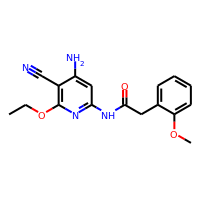
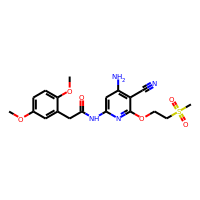
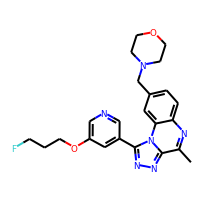
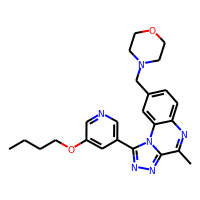
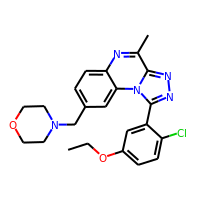
...
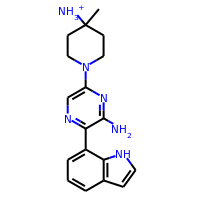
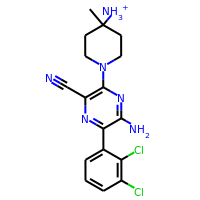
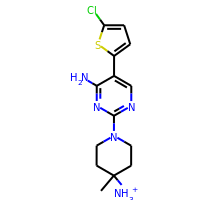
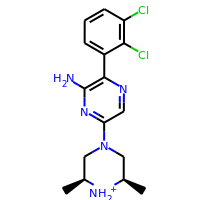
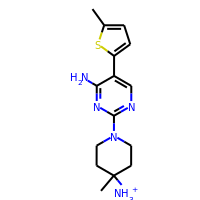

In [24]:
HTML(notConvEdges[['target',                    0,                        1,
                         'Mol1',                   'Mol2',
       'exp. DeltaG [kcal/mol]',  'exp. Error [kcal/mol]']].to_html())

# Converged Simulations only

In [ ]:
difftmp = diff[bConv]
resultstmp = all_edges[bConv]
    
fig = go.Figure()
fig.update_layout(
    width=600,
    title='Histogram of Deviation between Parsley and Exp.,<br>colors denote different targets.',
    barmode='stack', 
    xaxis = dict(title='DDG(parsley)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis2 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis3 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis4 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis5 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis6 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
    yaxis = dict(title='Count Converged', range=(0,120)),
#     yaxis3 = dict(title='Count (Converged)', range=(0,100)),
#     yaxis5 = dict(title='Count (Not converged)', range=(0,100)),
    colorway=colors.qualitative.Safe + colors.qualitative.Vivid)
# diff2 = results['parsley']-results['gaff']
for i, target in enumerate(targets.target_list):
    fig.add_trace(
        go.Histogram        (
            x=difftmp[resultstmp['target']==target['name']], 
            xbins_size=0.5, 
            name=target['name'],
            marker_color=fig.layout.colorway[i],
            legendgroup='group1'))
mu, std = 0.0, np.std(difftmp)
fig.add_trace(
    go.Scatter(
    x=np.linspace(-7,7),
    y=norm.pdf(np.linspace(-7,7), mu, std)*difftmp.shape[0]*.5,
        line_color='black',
        line_width=3,
        name=f'$\sigma={std:.1f}$'
        
    )
)

fig.write_image('hist_parsley_exp_conv.png')
fig.show()

In [ ]:
# Not converged simulations only

In [ ]:
difftmp = diff[bUnConv]
resultstmp = all_edges[bUnConv]
    
fig = go.Figure()
fig.update_layout(
    width=600,
    title='Histogram of Deviation between Parsley and Exp.,<br>colors denote different targets.',
    barmode='stack', 
    xaxis = dict(title='DDG(parsley)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis2 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis3 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis4 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis5 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis6 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
    yaxis = dict(title='Count not Converged', range=(0,120)),
#     yaxis3 = dict(title='Count (Converged)', range=(0,100)),
#     yaxis5 = dict(title='Count (Not converged)', range=(0,100)),
    colorway=colors.qualitative.Safe + colors.qualitative.Vivid,
#    plot_bgcolor='white'
)
# diff2 = results['parsley']-results['gaff']
for i, target in enumerate(targets.target_list):
    fig.add_trace(
        go.Histogram        (
            x=difftmp[resultstmp['target']==target['name']], 
            xbins_size=0.5, 
            name=target['name'],
            marker_color=fig.layout.colorway[i],
            legendgroup='group1'))
mu, std = 0.0, np.std(difftmp)
fig.add_trace(
    go.Scatter(
    x=np.linspace(-7,7),
    y=norm.pdf(np.linspace(-7,7), mu, std)*difftmp.shape[0]*.5,
        line_color='black',
        line_width=3,
        name=f'$\sigma={std:.1f}$'
        
    )
)

fig.write_image('hist_parsley_exp_nconv.png')
fig.show()

In [ ]:
from scipy.stats import norm
fig = go.Figure()
fig.update_layout(
    width=600,
    title='Histogram of Deviation between Parsley and GAFF 2.1.,<br>colors denote different targets.',
    barmode='stack', 
    xaxis = dict(title='DDG(Parsley)-DDG(GAFF) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis2 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis3 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis4 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis5 = dict(title='DDG(parlsey)-DDG(exp) [kcal mol<sup>-1</sup>]', range=(-8,8)),
#     xaxis6 = dict(title='DDG(parlsey)-DDG(gaff) [kcal mol<sup>-1</sup>]', range=(-8,8)),
    yaxis = dict(title='Count', range=(0,120)),
#     yaxis3 = dict(title='Count (Converged)', range=(0,100)),
#     yaxis5 = dict(title='Count (Not converged)', range=(0,100)),
    colorway=colors.qualitative.Safe + colors.qualitative.Vivid)
diff = results['parsley']-results['gaff']

# diff2 = results['parsley']-results['gaff']
for i, target in enumerate(targets.target_list):
    fig.add_trace(
        go.Histogram        (
            x=diff[results['target']==target['name']], 
            xbins_size=0.5, 
            name=target['name'],
            marker_color=ya,
            legendgroup='group1'))
mu, std = 0.0, np.std(diff)
fig.add_trace(
    go.Scatter(
    x=np.linspace(-7,7),
    y=norm.pdf(np.linspace(-7,7), mu, std)*diff.shape[0]*.5,
        line_color='black',
        line_width=3,
        name=f'$\sigma={std:.1f}$'
        
    )
)

fig.write_image('hist_parsley_gaff.png')
fig.show()

In [ ]:
resultsCM = results[bCM]

In [ ]:
resultsCM.loc[:,'Dparsley-exp'] = resultsCM.loc[:,'parsley'] - resultsCM.loc[:,'exp']
resultsCM.loc[:,'Dparsley-exp'] = resultsCM.loc[:,'Dparsley-exp'].abs()
resultsCM.loc[:,'Dparsley-gaff'] = resultsCM.loc[:,'parsley'] - resultsCM.loc[:,'gaff']
resultsCM.loc[:,'Dparsley-gaff'] = resultsCM.loc[:,'Dparsley-gaff'].abs()

outliers = resultsCM.sort_values(by='Dparsley-exp').iloc[-10:,:]
outliers2 = resultsCM.sort_values(by='Dparsley-gaff').iloc[-10:,:]

In [ ]:
outDF = pd.DataFrame()
outSet = []
for e in outliers.index.values[::-1]:
    ed = e.split('_edge_')
    target = ed[0]
    edge = 'edge_' + '_'.join(ed[1:])
    if target=='jnk1':
        ed = ed[1].split('_')
        edge = 'edge_' + ed[0] + '-1_' + ed[1] + '-1'
    eSet = edges.edgeSet(target)
    outSet.append(eSet[edge])
    df = eSet[edge].getDF()
    df['target'] = target
    #df['index'] = e
    df['dg_p-e'] = resultsCM.loc[e,'Dparsley-exp']
    df['dg_parsley'] = results.loc[e,'parsley']
    df['dg_gaff'] = results.loc[e,'gaff']
    

    outDF = outDF.append(df,ignore_index=True)
#print(outSet)
# for e in outSet:
#     e._data['Mol1'].
#     print(e._data['Mol1'])
#     print(pd.DataFrame(e))
# for e in outliers2.index.values:
#     if e not in outDF['index'].values:
#         ed = e.split('_edge_')
#         target = ed[0]
#         edge = 'edge_' + '_'.join(ed[1:])
#         eSet = edges.edgeSet(target)
#         df = eSet[edge].getDF()
#         df['target'] = target
#         df['index'] = e
#         df['exp'] = 0
#         df['gaff'] = 1
#         outDF = outDF.append(df,ignore_index=True)
#     else:
#         outDF.loc[outDF['index']==e,'gaff'] = 1
#outDF.index=outDF['index']
outDF2 = outDF.copy()
outDF.drop(columns=['Smiles1', 'Smiles2', 'exp. Error [kcal/mol]'], inplace=True)
#PandasTools.SaveSMILESFromFrame(outDF, 'test.smi', molCol='Mol1')
#smiDF = pd.DataFrame(outDF['Smiles1'])
#PandasTools.AddMoleculeColumnToFrame(outDF, smilesCol="Smiles1", molCol="ROMol", includeFingerprints=False)
# PandasTools.SaveXlsxFromFrame(outDF, 'test1.xlsx', molCol='Mol1')
#PandasTools.SaveXlsxFromFrame(outDF['Mol2'], 'test2.xlsx', molCol='Mol2')
HTML(outDF.to_html())
#outDF

In [ ]:
for i, edge in outDF2.iterrows():
    x1 = Chem.MolFromSmiles(edge['Smiles1'].values[0])
    x2 = Chem.MolFromSmiles(edge['Smiles2'].values[0])

    d2d = rdMolDraw2D.MolDraw2DSVG(600,280,300,280)
    d2d.DrawMolecules([x1, x2])
    d2d.FinishDrawing()
    print(f'{edge["target"]}_{edge[0]}_{edge[1]}.svg')
    file = open(f'{edge["target"]}_{edge[0]}_{edge[1]}.svg', 'w')
    print(d2d.GetDrawingText(), file=file)
    file.close()
SVG(d2d.GetDrawingText())

In [ ]:
for i, edge in outDF2.iterrows():
    x1 = Chem.MolFromSmiles(edge['Smiles1'].values[0])
    x2 = Chem.MolFromSmiles(edge['Smiles2'].values[0])

    d2d = rdMolDraw2D.MolDraw2DSVG(600,280,300,280)
    d2d.DrawMolecules([x1, x2])
    d2d.FinishDrawing()
    print(f'{edge["target"]}_{edge[0]}_{edge[1]}.svg')
    file = open(f'{edge["target"]}_{edge[0]}_{edge[1]}.svg', 'w')
    print(d2d.GetDrawingText(), file=file)
    file.close()
    break
print(edge['Smiles2'].values)
SVG(d2d.GetDrawingText())

In [ ]:
alt_smiles = 'Cc4cnc(c3cccc(Cn2nc(c1cc(F)cc(F)c1)ccc2=O)c3)[nH]4'
d2d = rdMolDraw2D.MolDraw2DSVG(300,280,300,280)
x2 = Chem.MolFromSmiles(alt_smiles)
d2d.DrawMolecules([x2])
d2d.FinishDrawing()
print(f'{edge["target"]}_{edge[0]}_{edge[1]}_alt.svg')
file = open(f'{edge["target"]}_{edge[0]}_{edge[1]}_alt.svg', 'w')
print(d2d.GetDrawingText(), file=file)
file.close()
SVG(d2d.GetDrawingText())

In [ ]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    #is_max = s == s.max()
    return 'background-color: red'
outDF = outDF[['target',                    0,                        1,
                         'Mol1',                   'Mol2',
       'exp. DeltaG [kcal/mol]',  'exp. Error [kcal/mol]']].style.applymap(highlight_max, subset=['target'])
# #[['target',                    0,                        1,
#                          'Mol1',                   'Mol2',
#        'exp. DeltaG [kcal/mol]',  'exp. Error [kcal/mol]']]
HTML(outDF.render())

In [ ]:
outDF = pd.DataFrame()
outSet = []
for e in outliers.index.values:
    ed = e.split('_edge_')
    target = ed[0]
    edge = 'edge_' + '_'.join(ed[1:])
    eSet = edges.edgeSet(target)
    outSet.append(eSet[edge])
    df = eSet[edge].getDF()
    df['target'] = target
    df['index'] = e
# 

    outDF = outDF.append(df,ignore_index=True)
print(outSet)
# for e in outSet:
#     e._data['Mol1'].
#     print(e._data['Mol1'])
#     print(pd.DataFrame(e))
# for e in outliers2.index.values:
#     if e not in outDF['index'].values:
#         ed = e.split('_edge_')
#         target = ed[0]
#         edge = 'edge_' + '_'.join(ed[1:])
#         eSet = edges.edgeSet(target)
#         df = eSet[edge].getDF()
#         df['target'] = target
#         df['index'] = e
#         df['exp'] = 0
#         df['gaff'] = 1
#         outDF = outDF.append(df,ignore_index=True)
#     else:
#         outDF.loc[outDF['index']==e,'gaff'] = 1
outDF.index=outDF['index']
outDF.drop(columns=['index', 'Smiles1', 'Smiles2'], inplace=True)
#PandasTools.SaveSMILESFromFrame(outDF, 'test.smi', molCol='Mol1')
#smiDF = pd.DataFrame(outDF['Smiles1'])
#PandasTools.AddMoleculeColumnToFrame(outDF, smilesCol="Smiles1", molCol="ROMol", includeFingerprints=False)
# PandasTools.SaveXlsxFromFrame(outDF, 'test1.xlsx', molCol='Mol1')
#PandasTools.SaveXlsxFromFrame(outDF['Mol2'], 'test2.xlsx', molCol='Mol2')
HTML(outDF.to_html())
#outDF

In [ ]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=len(targets.target_list), cols=1, subplot_titles=[t['name'] for t in targets.target_list])
for i, target in enumerate(targets.target_list):
    target = target["name"]
    if not os.path.exists(f'../results/{target}_{forcefield}.csv'):
        continue
    print(target)
    df = getFFResults(target)
    df.columns = pd.Series([x[0] for x in df.columns])
    df['edge']=df.index
    #bTargetConv = [ bC if t else False for bC, t in zip(bConv, resultsDF['target']==target) ]
    for ff in ['gaff', 'cgenff', 'fep5', 'parsley']:
        fig.add_trace(go.Violin(y=df[ff]-df['exp'], hovertext=df.index, name=ff), row=i+1, col=1)
    #fig.add_trace(go.Violin(y=resultsDF['AD'][bTargetConv], hovertext=resultsDF.index[bTargetConv], name=f'{target} filtered'))
fig.update_layout(
    title='Absolute Deviation (AD) between calculated and experimental results<br>filtered set excludes edges with convergence > 0.8',
    yaxis=dict(range=[-10,10], title='AD(exp-calc) [kcal mol<sup>-1</sup>]'),
    width=800,
    height=1600)

# Extract convergence and analytical errors

In [ ]:
forcefield = 'openff-1.0.0.offxml'
for target in targets.target_list:
    target = target["name"]
    if not os.path.exists(f'../results/{target}_{forcefield}.dat'):
        continue
    print(target)
    df = getFFResults(target)
    lgs = ligands.ligandSet(target).getDF()
    print(lgs)
    lgs.index = lgs['name']
    smiles = []
    for i, row in df.iterrows():
        smiles.append([lgs.loc[f'lig_{row["lig1"]}', 'smiles'].values[0], lgs.loc[f'lig_{row["lig2"]}', 'smiles'].values[0]])
    df, results = getRawResults(target, forcefield=forcefield)
    plotting.plot_DDGs(results, smiles=smiles, method_name_y='pmx',target_name=target,map_positive=False, symmetrise=True, filename=f'{target}_ddg.png', plotly=True)
#     network = wrangle.FEMap(results)
#     plotting.plot_DGs(network.graph,method_name_y='pmx',target_name=target, filename=f'{target}_dg.png', plotly=True)

# Correlation plots with experiment

In [ ]:
def getRawResults(target, forcefield='openff-1.0.0.offxml'):
    # read in result file
    res = pd.read_csv(f'../results/{target}_{forcefield}.dat', header=None, comment='#', skipinitialspace=True, names=['calc DDG', 'calc dDDG' , 'add dDDG'], sep=' ')
    # read in exp. data
    edg = edges.edgeSet(target)
    df = edg.getDF(columns=[0,1, 'exp. DeltaG [kcal/mol]', 'exp. Error [kcal/mol]'])
    df.index = pd.Series(['edge_' + str(lig1) + '_' + str(lig2) for lig1, lig2 in zip(df[0].values, df[1].values)])
   
    # copy in calculated values
    df['calc_DDG'] = res.loc[:,'calc DDG']
    df['calc_dDDG'] = res.loc[:,'calc dDDG']
    df['calc_dDDG(additional)'] = res.loc[:, 'add dDDG']
    
    # remove unit of calculated values
    df['exp_DDG'] = df['exp. DeltaG [kcal/mol]'].apply(lambda x: x.magnitude)
    df['exp_dDDG'] = df['exp. Error [kcal/mol]'].apply(lambda x: x.magnitude)
    
    # add additional error line (so fare 0.0)
   # df['calc_dDDG(additional)'] = df['exp. Error [kcal/mol]'].apply(lambda x: 0.0)

    # filter only to relevant columns
    df = df.filter(items = [0,1,'exp_DDG', 'exp_dDDG', 'calc_DDG', 'calc_dDDG', 'calc_dDDG(additional)'])
    df[0]= df[0].astype(str)
    df[1]= df[1].astype(str)
    # create Results objects
    results = []
    for i, row in df.iterrows():
        results.append(wrangle.Result(*row.values))
    return df, results

In [ ]:
forcefield = 'openff-1.0.0.offxml'
dfs = []
results = []
smiles = []
for target in targets.target_list:
    target = target["name"]
    if not os.path.exists(f'../results/{target}_{forcefield}.csv'):
        continue
    print(target)
    df, res = getRawResults(target, forcefield=forcefield)
    df['target'] = target
    dfs.append(df)
    results+=res
    
    lgs = ligands.ligandSet(target).getDF()
    lgs.index = lgs['name']
    for i, row in df.iterrows():
        smiles.append([lgs.loc[f'lig_{row[0]}', 'smiles'].values[0], lgs.loc[f'lig_{row[1]}', 'smiles'].values[0]])
resultsDF = pd.concat(dfs)
smiles[:10], results[:10]

In [ ]:
plotting.plot_DDGs(results, smiles=smiles, method_name_y='pmx',target_name='all edges symmetrized',map_positive=False, symmetrise=True, filename=None, plotly=True)

### Filter out not converged edges.

In [ ]:
filtered_results = [res for res, bC in zip(results, bConv) if bC]
filtered_smiles = [smi for smi, bC in zip(smiles, bConv) if bC]
plotting.plot_DDGs(filtered_results, smiles=filtered_smiles, method_name_y='pmx',target_name='all edges symmetrized',map_positive=False, symmetrise=True, filename=None, plotly=True)

In [ ]:
resultsDF['AD'] = (resultsDF['exp_DDG'] - resultsDF['calc_DDG']).abs()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Violin(y=resultsDF['AD'], hovertext=resultsDF.index, name='all edges'))
fig.add_trace(go.Violin(y=resultsDF['AD'][bConv], hovertext=resultsDF.index[bConv], name='all edges filtered'))
fig.update_layout(
    title='Absolute Deviation (AD) between calculated and experimental results<br>filtered set excludes edges with convergence > 0.8',
    yaxis=dict(range=[0,10], title='AD(exp-calc) [kcal mol<sup>-1</sup>]'))

In [ ]:
fig = go.Figure()

for target in targets.target_list:
    target = target["name"]
    if not os.path.exists(f'../results/{target}_{forcefield}.csv'):
        continue
    bTargetConv = [ bC if t else False for bC, t in zip(bConv, resultsDF['target']==target) ]
    fig.add_trace(go.Violin(y=resultsDF['AD'][resultsDF['target']==target], hovertext=resultsDF.index[resultsDF['target']==target], name=target))
    fig.add_trace(go.Violin(y=resultsDF['AD'][bTargetConv], hovertext=resultsDF.index[bTargetConv], name=f'{target} filtered'))
fig.update_layout(
    title='Absolute Deviation (AD) between calculated and experimental results<br>filtered set excludes edges with convergence > 0.8',
    yaxis=dict(range=[0,10], title='AD(exp-calc) [kcal mol<sup>-1</sup>]'))

# Filter out outliers of *converged* simulations with an Absolute Deviation > 2 kcal/mol

In [ ]:
threshold = 2 #kcal / mol
bOutlier = resultsDF['AD'] > threshold
print(f'Number of outliers with AD > {threshold} kcal/mol: {bOutlier.sum()}')
bOutlier = [bO if bC else False for bO, bC in zip(bOutlier, bConv)]
print(f'Number of outliers with AD > {threshold} kcal/mol after removal of not converged outliers (=explainable outliers): {np.sum(bOutlier)}')
outlierEdges = resultsDF.index[bOutlier]
outlierTargets = resultsDF['target'][bOutlier]
dfs = []
for e, t in zip(outlierEdges, outlierTargets):
    eSet = edges.edgeSet(t)
    df = eSet[e].getDF()
    df['target'] = t
    dfs.append(df)
outlierEdges = pd.concat(dfs, axis=1).T
print('Number of outliers in different targets:\n', outlierTargets.value_counts())

In [ ]:
HTML(outlierEdges[['target',                    0,                        1,
                         'Mol1',                   'Mol2',
       'exp. DeltaG [kcal/mol]',  'exp. Error [kcal/mol]']].to_html())

In [ ]:
f'The outliers occur solely in {outlierTargets.value_counts().shape[0]} out of {resultsDF["target"].value_counts().shape[0]} targets. This could hint to errors in the system preparation or special interaction types which are not well described by the force field.'

all_edges.columns